In [1]:
%load_ext autoreload
%autoreload 2

import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from attention.img_proc.img_process import *
from attention.img_proc.img_split import *
from attention.models.face_models import *
from attention.utils.img_plot import *
from attention.utils.utilities import *
from attention.params import *
import copy

objc[1935]: Class CaptureDelegate is implemented in both /Users/amine/.pyenv/versions/3.10.6/envs/attention-env/lib/python3.10/site-packages/cv2/cv2.abi3.so (0x15e1524e8) and /Users/amine/.pyenv/versions/3.10.6/envs/attention-env/lib/python3.10/site-packages/mediapipe/.dylibs/libopencv_videoio.3.4.16.dylib (0x168d28860). One of the two will be used. Which one is undefined.
objc[1935]: Class CVWindow is implemented in both /Users/amine/.pyenv/versions/3.10.6/envs/attention-env/lib/python3.10/site-packages/cv2/cv2.abi3.so (0x15e152538) and /Users/amine/.pyenv/versions/3.10.6/envs/attention-env/lib/python3.10/site-packages/mediapipe/.dylibs/libopencv_highgui.3.4.16.dylib (0x15c030a68). One of the two will be used. Which one is undefined.
objc[1935]: Class CVView is implemented in both /Users/amine/.pyenv/versions/3.10.6/envs/attention-env/lib/python3.10/site-packages/cv2/cv2.abi3.so (0x15e152560) and /Users/amine/.pyenv/versions/3.10.6/envs/attention-env/lib/python3.10/site-packages/media

In [2]:
# Get attention_data directory
current_directory = os.getcwd()
data_test_directory = os.path.join(current_directory, os.pardir, "attention_data_test")

In [3]:
# Training the face recognition model
known_folder_path = os.path.join(data_test_directory, "known_faces")
known_paths = load_image_paths(known_folder_path)
known_names = list(known_paths.keys())
known_faces = [read_image(image_path) for image_path in known_paths.values()]
known_encodings = train_faces(known_faces, known_names)

In [4]:
# PARAMS:
n_split_w = 6
n_split_h = 6
landmark_idx = LEFT_EYE_EDGES  + LEFT_IRIS_CENTER + RIGHT_EYE_EDGES + RIGHT_IRIS_CENTER

# Dataframe columns
df_columns =  ['frame',
'timestamp',
'face_idx',
'recognition_prediction',
'recognition_distance',
'attentive',
'left_prediction',
'left_score',
'right_prediction',
'right_score',
'head_direction_prediction',
'head_direction_score',
'head_inclination_prediction',
'head_inclination_score']

## Testing faces from dataframe

In [5]:
# Get test_focus directory
current_directory = os.getcwd()
data_test_directory = os.path.join(current_directory, os.pardir, "attention_data_test")

In [6]:
focus_df = pd.read_csv(os.path.join(data_test_directory, 'test_focus.csv'))
focus_df[['frame', 'face_idx']]

,frame,face_idx
0,video2_ds430,2
1,video2_ds440,2
2,video2_ds920,1
3,video2_ds930,2
4,video2_ds950,2
5,video2_ds970,2
6,video2_ds980,2
7,video2_ds990,1
8,video2_ds1000,2
9,video2_ds1010,2


In [35]:
image_folder_path = os.path.join(data_test_directory, "frames")
image_paths = load_image_paths(image_folder_path)

test_df = pd.DataFrame(columns=df_columns) 

for image_name, image_path in image_paths.items():
    
    # FOCUSING ON IMAGES FROM THE FOCUS DATAFRAME 
    if image_name in focus_df.frame.values:
        
        # Loading image
        image = read_image(image_path)
        timestamp = int(image_name.split('_ds')[1]) if '_ds' in image_name else np.nan
        image_summary = image.copy()
        # Splitting image
        crops = split_image(image, n_split_w, n_split_h, 0.05, 0.05)
        # Generating bboxes for each crop
        bbox_crop_list = []
        bbox_crop_list_absolute = []
        for crop in crops:
            coord_set = detect_face(crop.image)
            bbox_crop_list.append(coord_set)
            coord_set_absolute = reconstruct_coord(crop, coord_set)
            bbox_crop_list_absolute.append(coord_set_absolute)
        bbox_crop_list_absolute
        # Eliminating duplicates bboxes
        bbox_list = bbox_merge(bbox_crop_list_absolute, intersect_threshold=0.6)
        # Drawing the unique bboxes on the original image
        image_output = annotate_bboxes(image, bbox_list)
        # Saving the image with its bboxes
        bbox_path = os.path.join(data_test_directory, "output_bbox")
        save_image(image_output, image_name + '.png', bbox_path)
        
        # Generating face crops
        faces = crop_faces(image, bbox_list)
        # Saving face crops
        face_path = os.path.join(data_test_directory, "face_crops")
        for face_idx, face in enumerate(faces):
            face_name = image_name + f'_{face_idx}'
            save_image(face, face_name + '.png', face_path)
        
        # Generating eye and iris landmarks
        for face_idx, face in enumerate(faces):
            
            # FOCUSING ON THE FACES IN THE FOCUS DATAFRAME
            if face_idx in focus_df[focus_df['frame'] == image_name]['face_idx'].values:
            
                face_name = image_name + f'_{face_idx}'
                mp_landmarks = find_landmarks(face)
                if mp_landmarks:                # Only run attention/ recognition if it detects a face
                    # Converting the Mediapipe landmark to a standard system of coordinates
                    landmark_list = convert_landmarks(face, mp_landmarks)
                    # Drawing the face mesh on the face
                    face_mesh = annotate_mesh(face, mp_landmarks)
                    # Saving face with complete mesh
                    mesh_path = os.path.join(data_test_directory, "output_mesh")
                    save_image(face_mesh, face_name + '.png', mesh_path)
                    
                    # Detecting eye direction and attention
                    face_name = image_name + f'_{face_idx}'
                    eye_directions = detect_eye_directions(landmark_list, extreme_threshold = 0.63, detailed_threshold_main = 0.6, detailed_threshold_comp = 0.45)
                    eye_inclinations = detect_eye_inclinations(landmark_list, threshold = 0.23)
                    head_direction = detect_head_direction(landmark_list, left_threshold = 0.35, right_threshold = 1)
                    head_inclination = detect_head_inclination(landmark_list, down_threshold = 2.3)
                    attention, attention_driver = is_attentive(eye_directions, eye_inclinations, head_direction, head_inclination)
                    # Drawing iris landmarks + annotating attention results on original image
                    prediction_lefteye_direction, score_lefteye_direction = eye_directions['left']
                    prediction_righteye_direction, score_righteye_direction = eye_directions['right']
                    prediction_lefteye_inclination, score_lefteye_inclination = eye_inclinations['left']
                    prediction_righteye_inclination, score_righteye_inclination = eye_inclinations['right']
                    prediction_head_direction, score_head_direction = head_direction
                    prediction_head_inclination, score_head_inclination = head_inclination
                    prediction_attention = 'attentive' if attention else 'inattentive'
                    face_attention = annotate_attention(face, landmark_list, 
                                                            prediction_lefteye_direction, score_lefteye_direction, 
                                                            prediction_righteye_direction, score_righteye_direction,
                                                            prediction_lefteye_inclination, score_lefteye_inclination, 
                                                            prediction_righteye_inclination, score_righteye_inclination,
                                                            prediction_head_direction, score_head_direction,
                                                            prediction_head_inclination, score_head_inclination,
                                                            prediction_attention)
                    # Saving attention image output
                    attention_path = os.path.join(data_test_directory, "output_attention")
                    save_image(face_attention, face_name + '.png', attention_path)
                
                
                    # Recognizing a face
                    face_name = image_name + f'_{face_idx}'
                    face_prediction = recognize_face(face, known_encodings)
                    # Annotating name and distance on the face image
                    prediction_recognition, distance_recognition = face_prediction
                    face_recognition = annotate_recognition(face, prediction_recognition, distance_recognition)
                    # Saving recognition image output
                    recognition_path = os.path.join(data_test_directory, "output_recognition")
                    save_image(face_recognition, face_name + '.png', recognition_path)
                    
                    
                    # Generating summary image
                    # Annotating with key info (bbox, attentiveness, recognition)
                    recognition = False if pd.isna(prediction_recognition) else True
                    bbox_face = bbox_list[face_idx]
                    image_summary = annotate_summary(image_summary, bbox_face, attention, attention_driver, recognition)
                    
                    
                    # Saving data in the dataframe
                    test_df.loc[len(test_df)] = [image_name,
                                                            timestamp,
                                                            face_idx,
                                                            prediction_recognition, distance_recognition,
                                                            attention,
                                                            prediction_lefteye_direction, score_lefteye_direction,
                                                            prediction_righteye_direction, score_righteye_direction,
                                                            prediction_head_direction, score_head_direction,
                                                            prediction_head_inclination, score_head_inclination]
                
        
        # Saving summary image once all faces done
        summary_path = os.path.join(data_test_directory, "output_summary")
        save_image(image_summary, image_name + '.png', summary_path)
    

## Test on one face

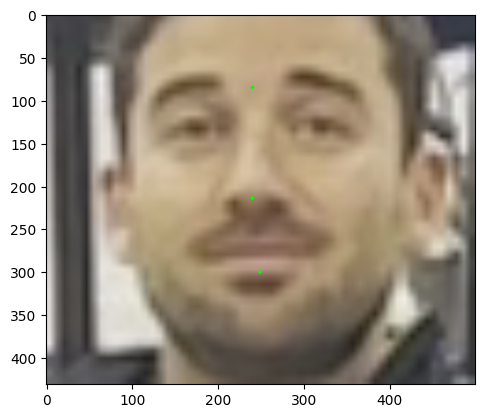

In [15]:
face_path = os.path.join(data_test_directory, "face_crops")
face_name = 'video2_ds1150_4'
face = read_image(os.path.join(face_path, face_name + '.png'))
mp_landmarks = find_landmarks(face)
landmark_list = convert_landmarks(face, mp_landmarks)
face_annotated = annotate_landmarks(face, landmark_list, FOREHEAD_MIDDLE + BOTTOM_LIP + NOSE)
plt.imshow(face_annotated)

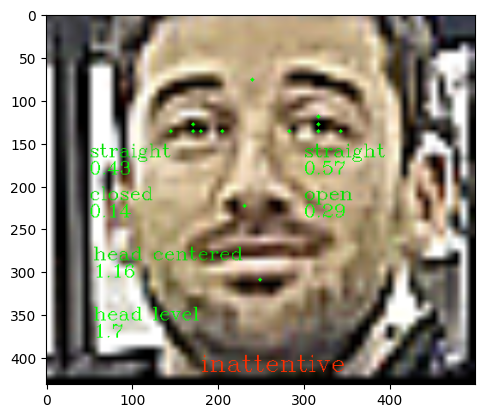

In [14]:
# Detecting eye direction and attention
eye_directions = detect_eye_directions(landmark_list, extreme_threshold = 0.63, detailed_threshold_main = 0.6, detailed_threshold_comp = 0.45)
eye_inclinations = detect_eye_inclinations(landmark_list, threshold = 0.23)
head_direction = detect_head_direction(landmark_list, left_threshold = 0.35, right_threshold = 1)
head_inclination = detect_head_inclination(landmark_list, down_threshold = 2.3)
attention, attention_driver = is_attentive(eye_directions, eye_inclinations, head_direction, head_inclination)
# Drawing iris landmarks + annotating attention results on original image
prediction_lefteye_direction, score_lefteye_direction = eye_directions['left']
prediction_righteye_direction, score_righteye_direction = eye_directions['right']
prediction_lefteye_inclination, score_lefteye_inclination = eye_inclinations['left']
prediction_righteye_inclination, score_righteye_inclination = eye_inclinations['right']
prediction_head_direction, score_head_direction = head_direction
prediction_head_inclination, score_head_inclination = head_inclination
prediction_attention = 'attentive' if attention else 'inattentive'
face_attention = annotate_attention(face, landmark_list, 
                                        prediction_lefteye_direction, score_lefteye_direction, 
                                        prediction_righteye_direction, score_righteye_direction,
                                        prediction_lefteye_inclination, score_lefteye_inclination, 
                                        prediction_righteye_inclination, score_righteye_inclination,
                                        prediction_head_direction, score_head_direction,
                                        prediction_head_inclination, score_head_inclination,
                                        prediction_attention)

plt.imshow(face_attention)


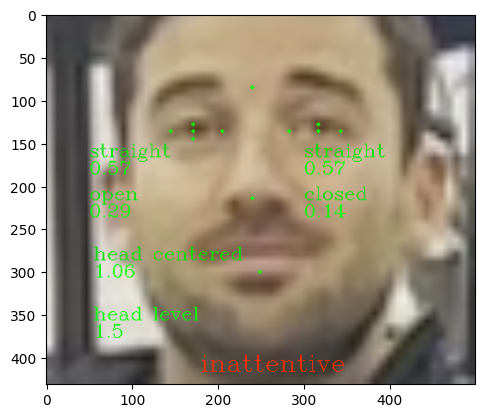

In [16]:
# Detecting eye direction and attention
eye_directions = detect_eye_directions(landmark_list, extreme_threshold = 0.63, detailed_threshold_main = 0.6, detailed_threshold_comp = 0.45)
eye_inclinations = detect_eye_inclinations(landmark_list, threshold = 0.23)
head_direction = detect_head_direction(landmark_list, left_threshold = 0.35, right_threshold = 1)
head_inclination = detect_head_inclination(landmark_list, down_threshold = 2.3)
attention, attention_driver = is_attentive(eye_directions, eye_inclinations, head_direction, head_inclination)
# Drawing iris landmarks + annotating attention results on original image
prediction_lefteye_direction, score_lefteye_direction = eye_directions['left']
prediction_righteye_direction, score_righteye_direction = eye_directions['right']
prediction_lefteye_inclination, score_lefteye_inclination = eye_inclinations['left']
prediction_righteye_inclination, score_righteye_inclination = eye_inclinations['right']
prediction_head_direction, score_head_direction = head_direction
prediction_head_inclination, score_head_inclination = head_inclination
prediction_attention = 'attentive' if attention else 'inattentive'
face_attention = annotate_attention(face, landmark_list, 
                                        prediction_lefteye_direction, score_lefteye_direction, 
                                        prediction_righteye_direction, score_righteye_direction,
                                        prediction_lefteye_inclination, score_lefteye_inclination, 
                                        prediction_righteye_inclination, score_righteye_inclination,
                                        prediction_head_direction, score_head_direction,
                                        prediction_head_inclination, score_head_inclination,
                                        prediction_attention)

plt.imshow(face_attention)


## Batch

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


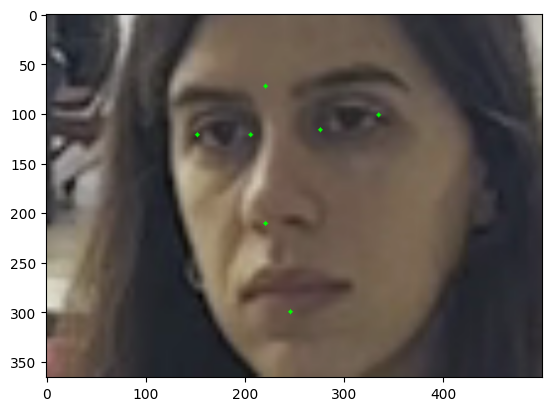

1.0644002897775877


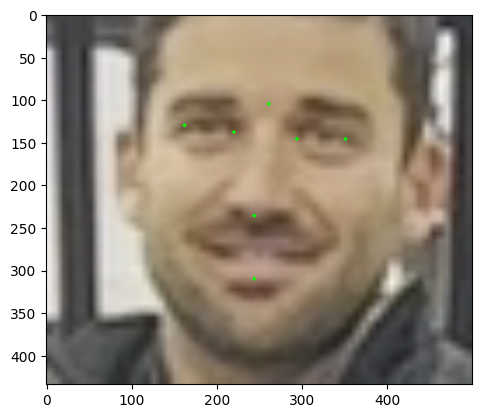

1.0058196417603766


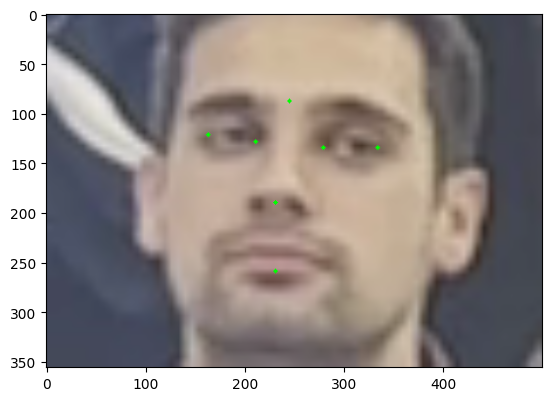

0.8394137148125379


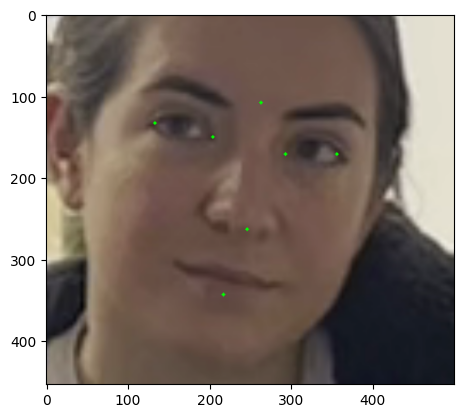

1.0239375690658274


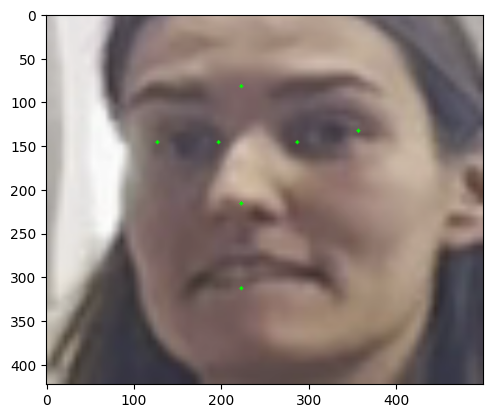

0.837324833970345


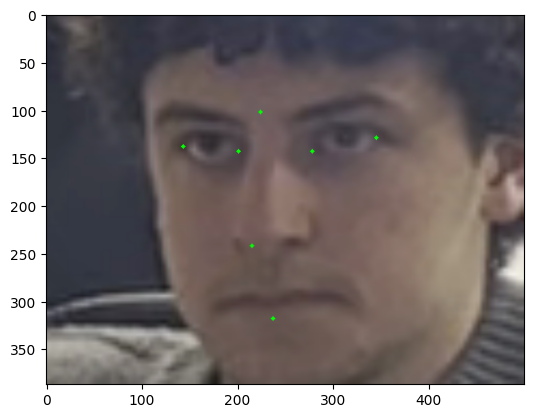

0.9665258991095709


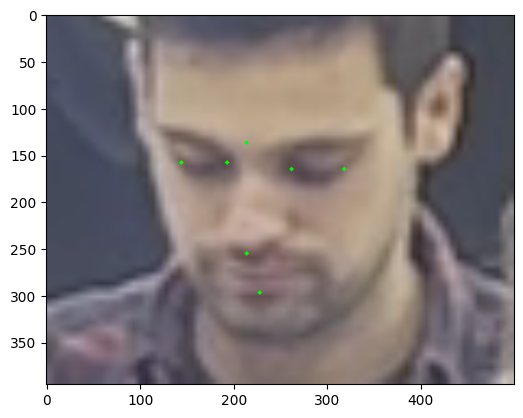

0.9429903335828895


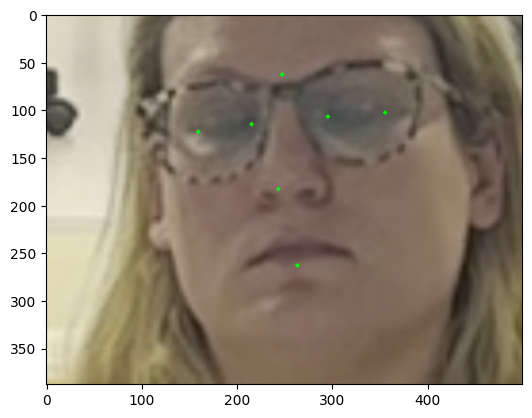

0.854485732530898


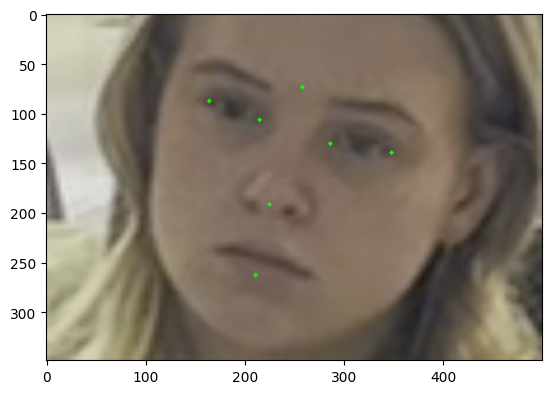

0.8995130068319102


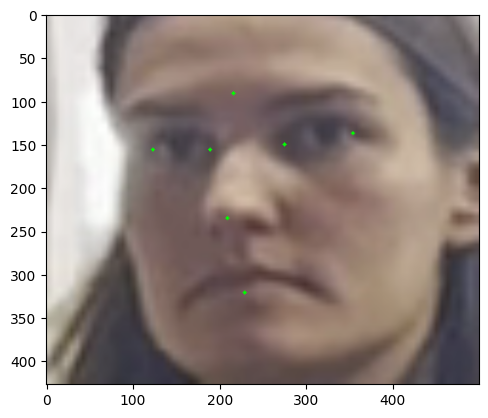

0.8746337674303098


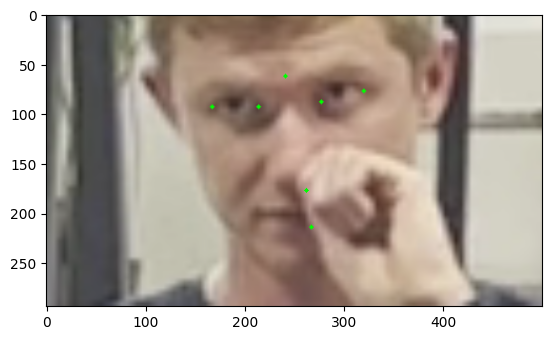

1.1056644552171162


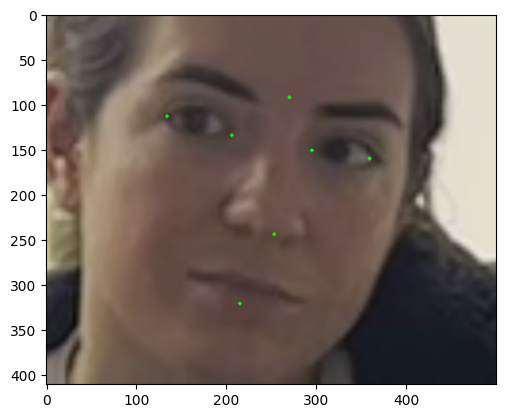

0.9924640975798495


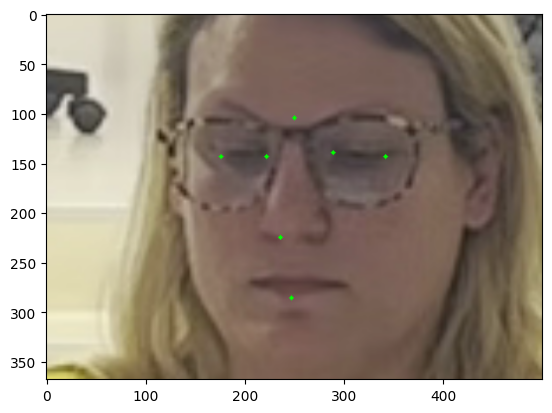

1.0068966334484524


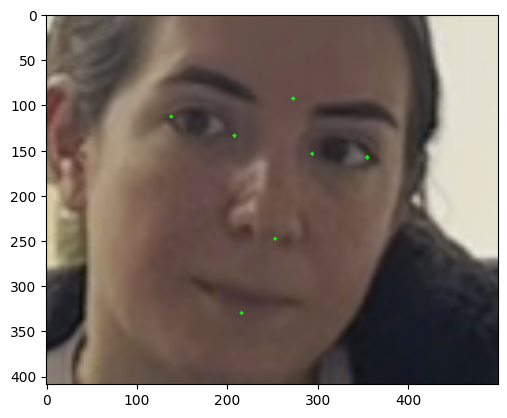

1.050168011726149


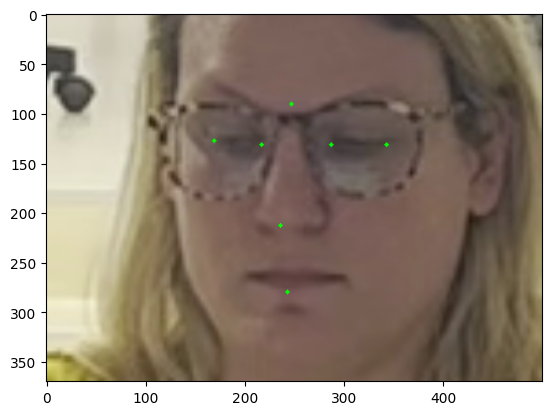

0.9745906779871113


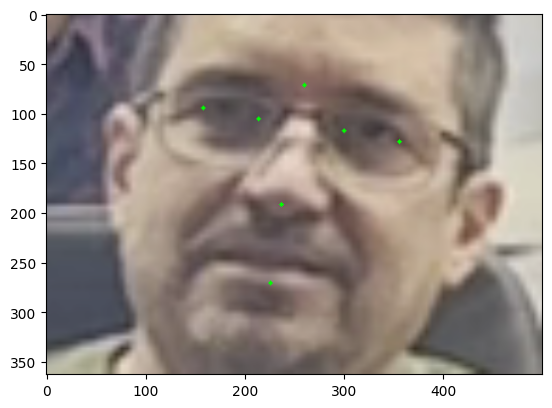

0.8443627881075275


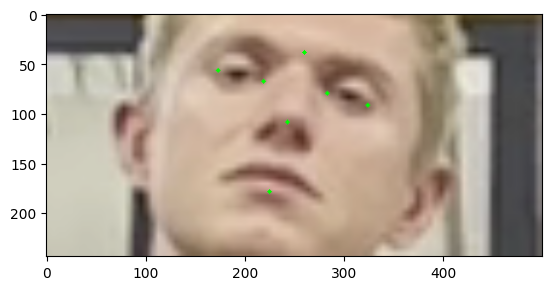

0.6708203932499369


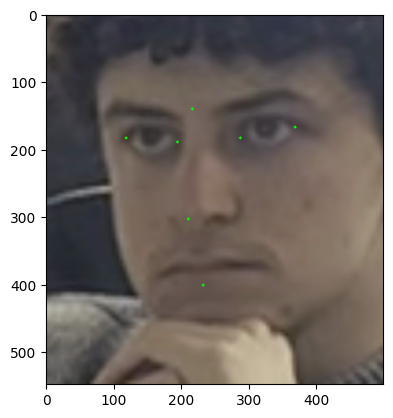

0.9307771773341641


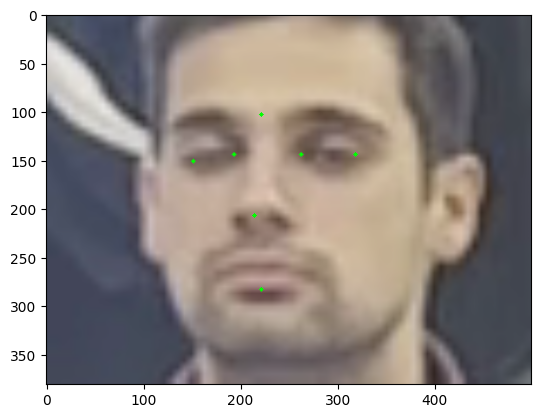

0.8351831321318283


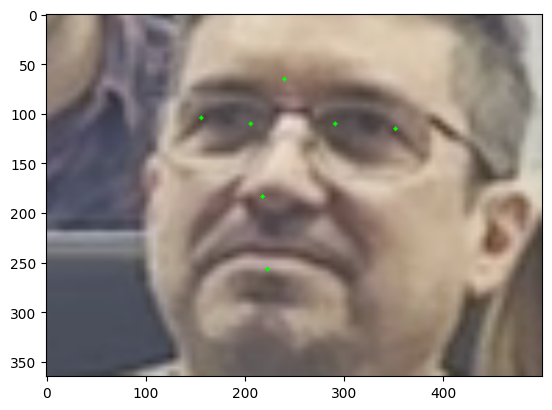

0.8216063093853777


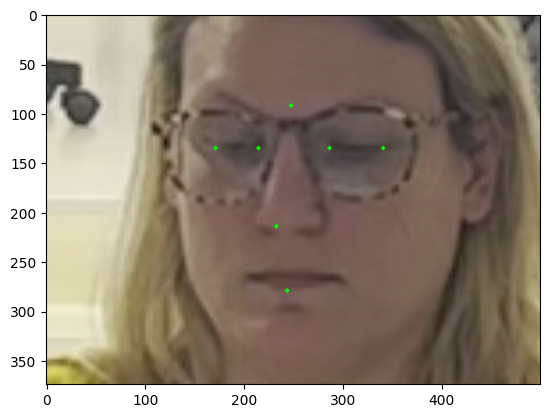

0.978128158207068


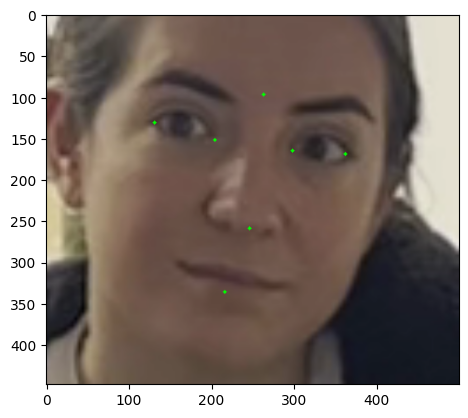

1.0267188634425377


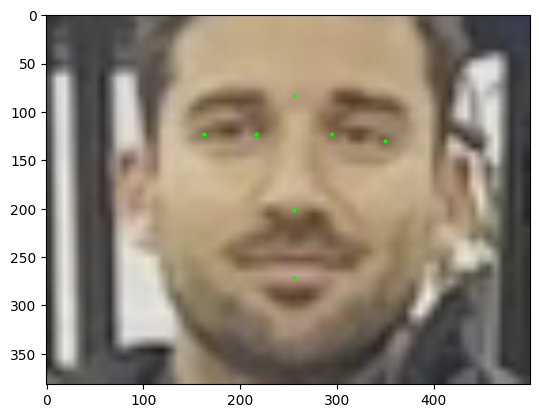

0.8808303292720552


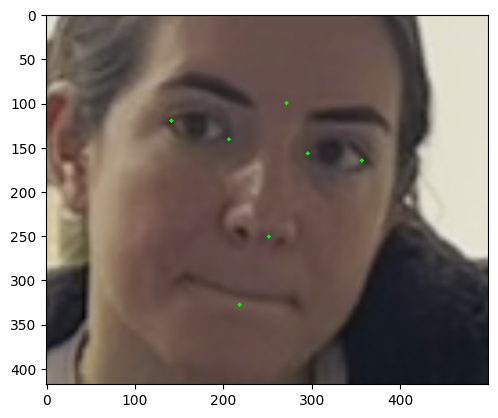

0.9960777171010995


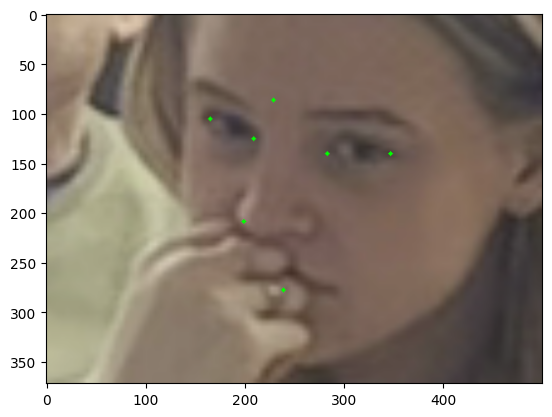

0.9129860380502285


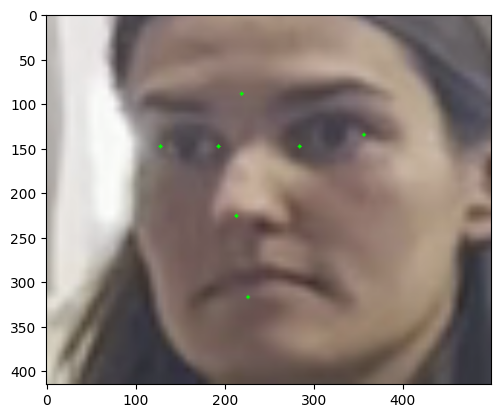

0.8382736442849094


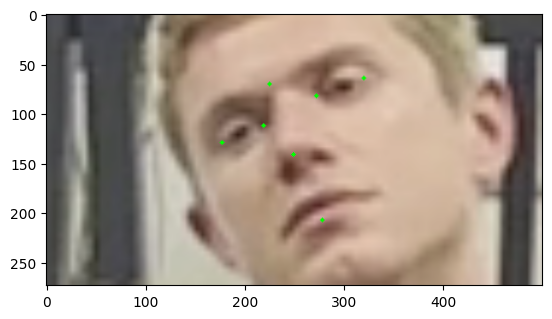

0.6732442278759411


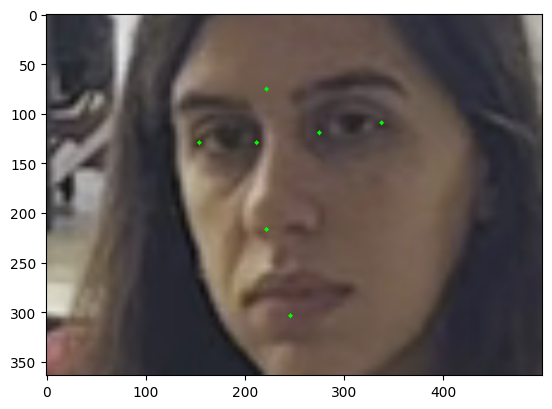

1.102414585841073


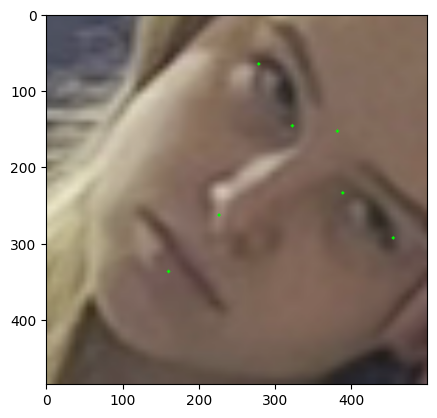

0.9591087022660315


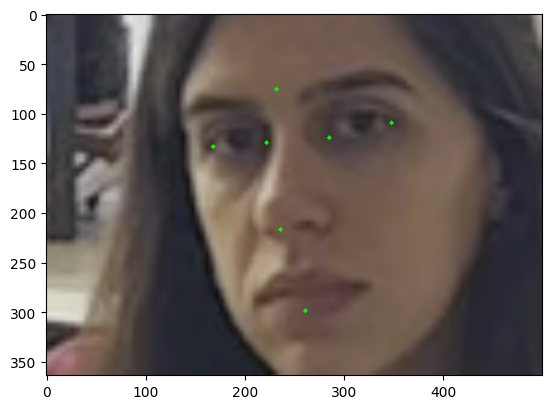

1.1030698100212637


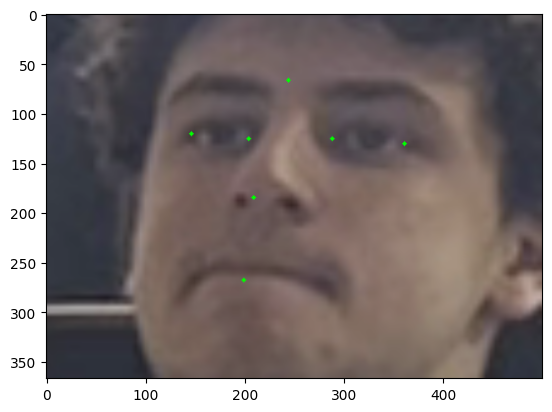

0.7808688094430304


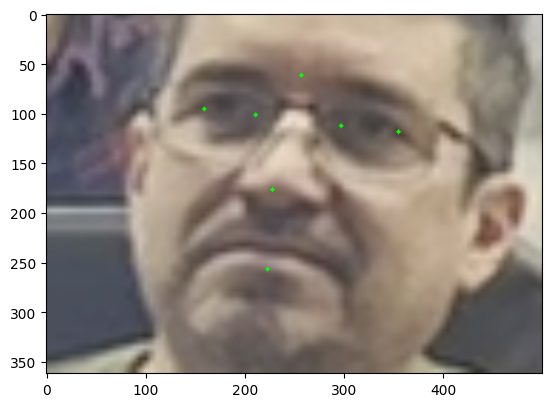

0.8187472156621811


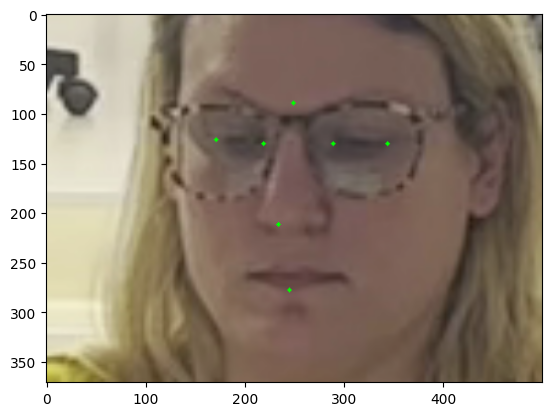

0.9776923610938036


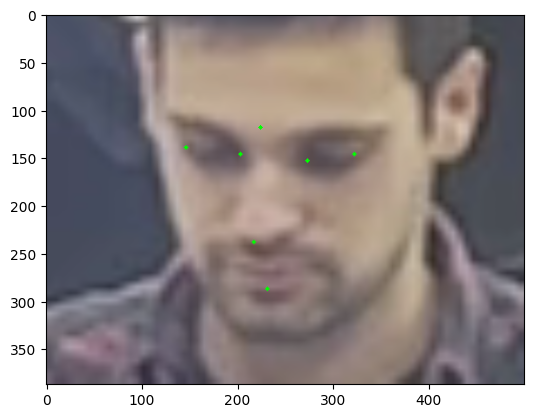

1.0017286097603766


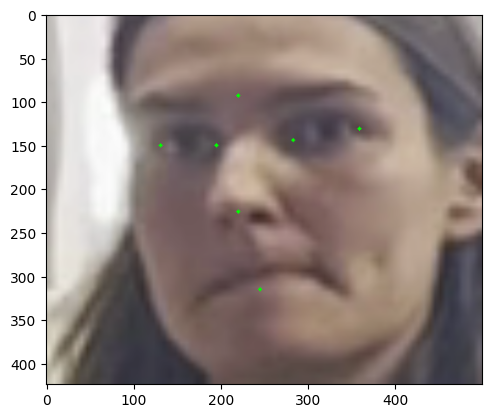

0.8023687558959136


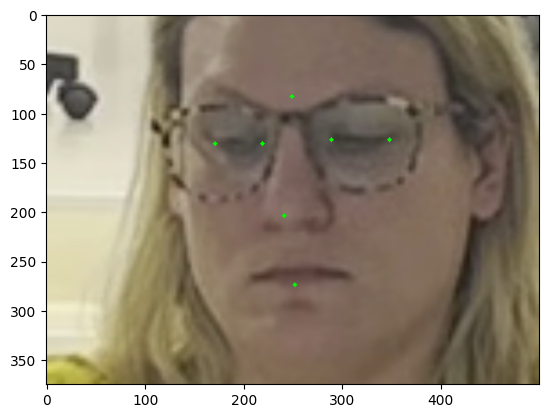

0.9442018475275232


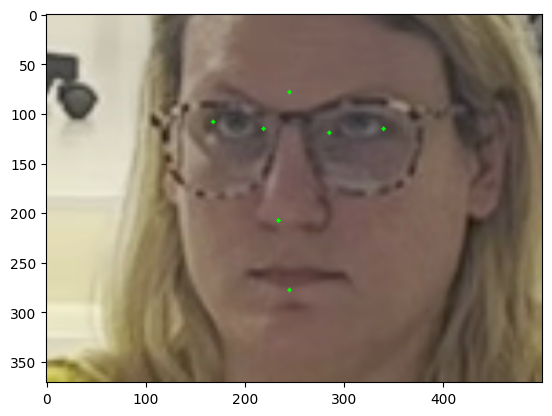

1.064495034560624


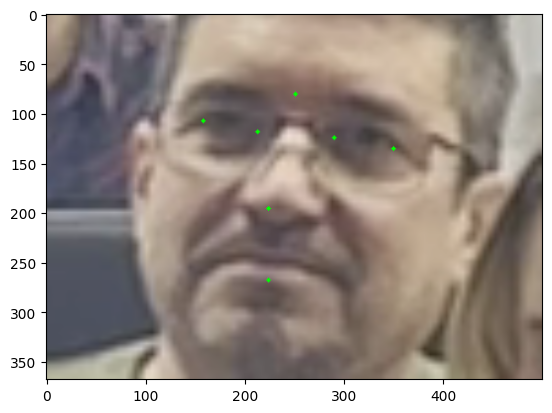

0.8573306088497379


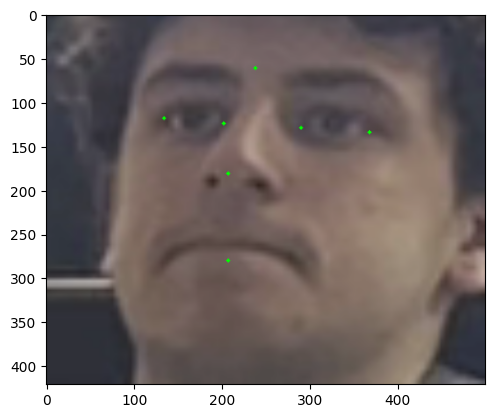

0.7413574677182622


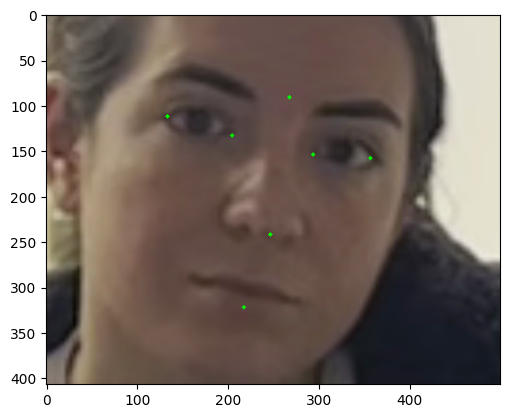

0.995862310634227


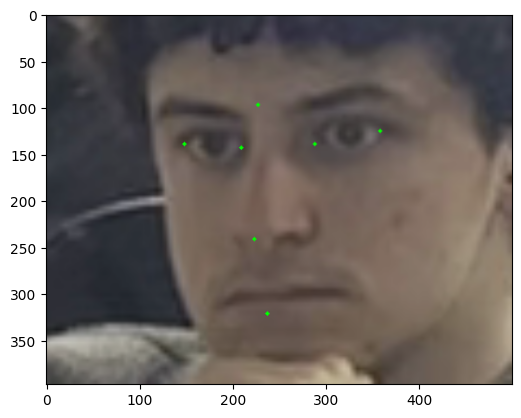

0.9617692030835673


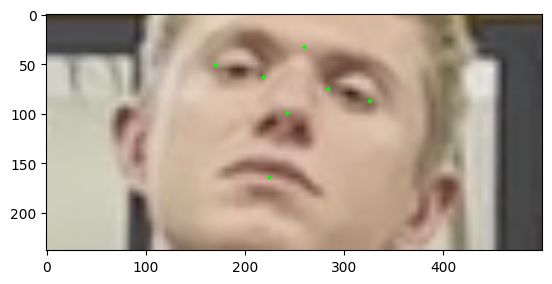

0.6183469424008423


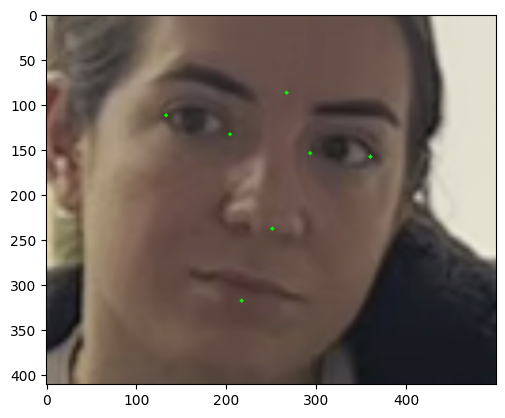

0.9663373268075153


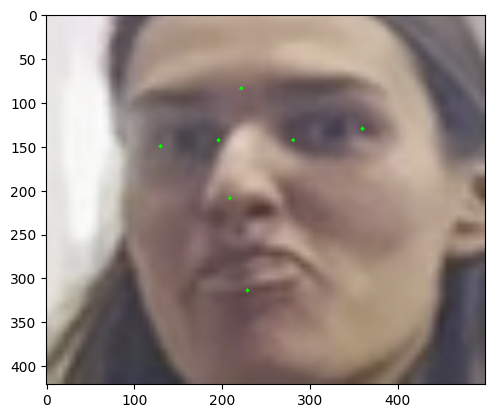

0.761765166256283


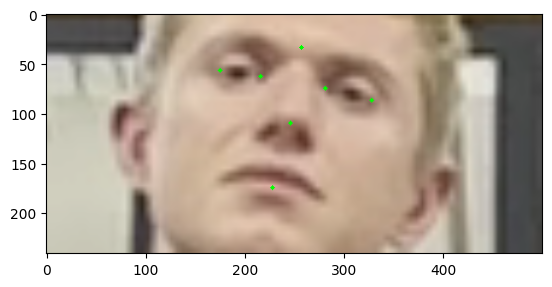

0.6774112057270402


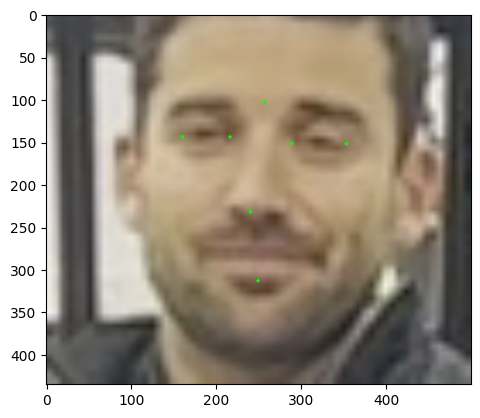

0.9468641529479985


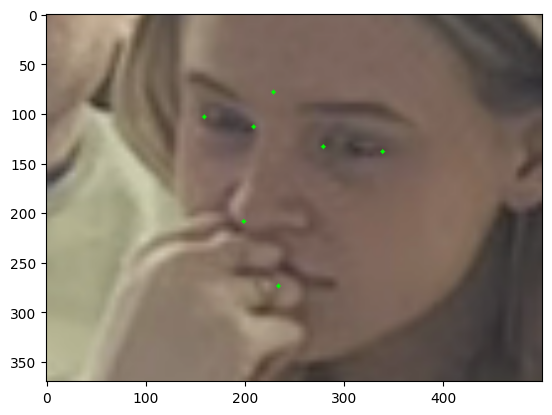

1.0078153941863142


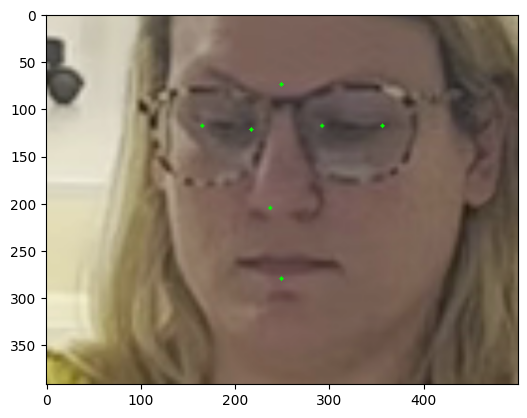

0.9463590398470144


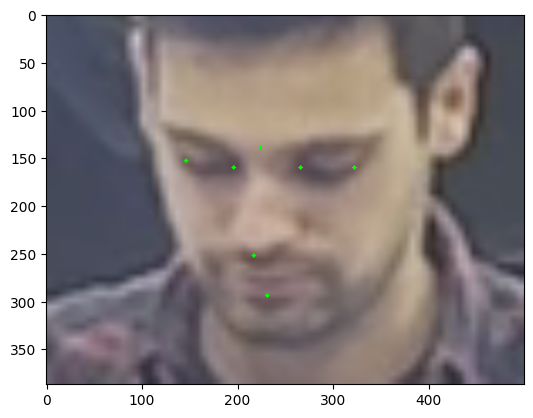

0.8906233078822999


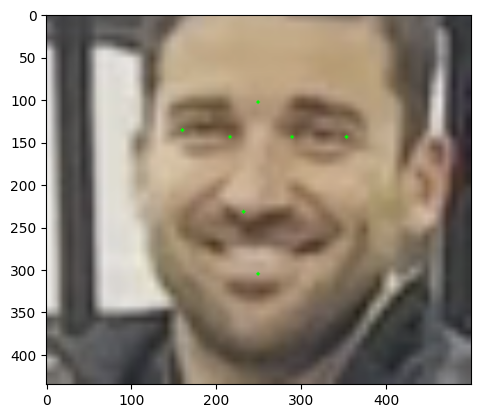

0.9485009115645352


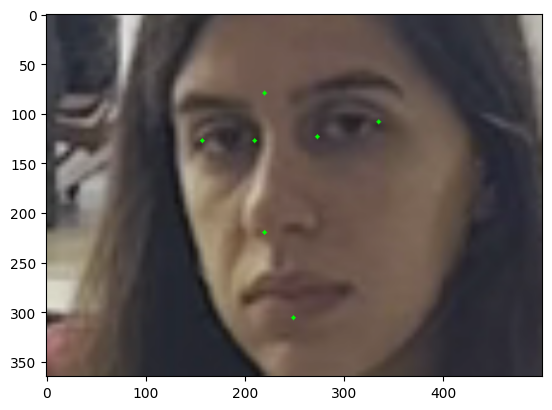

1.102414585841073


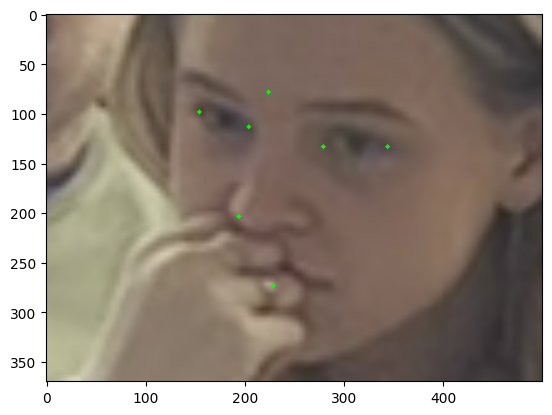

0.9089829481348921


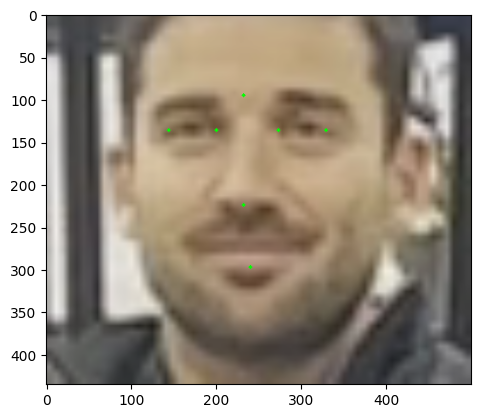

1.0


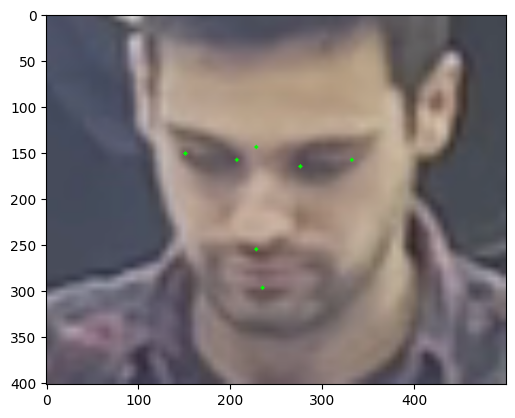

0.8888888888888888


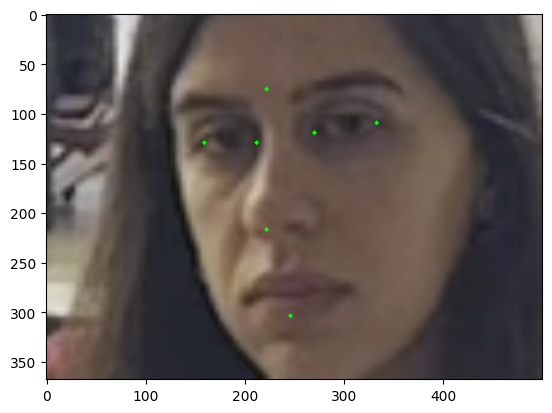

1.1454311330233782


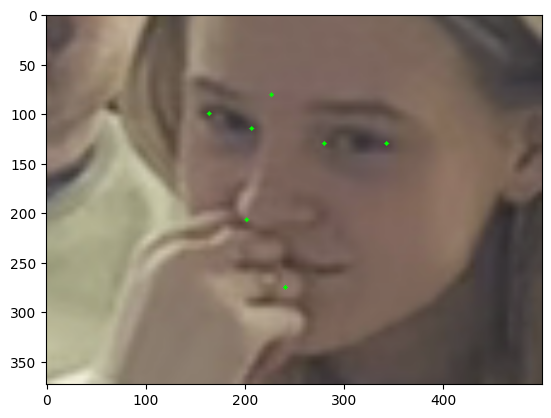

0.9402046945167978


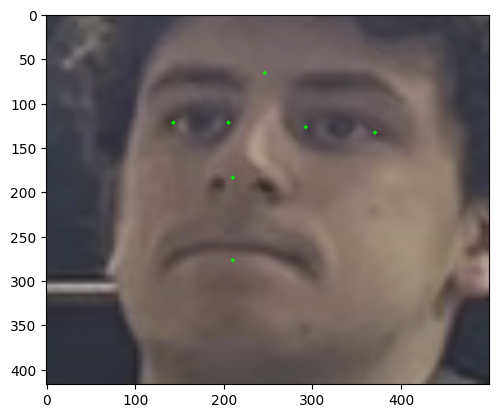

0.7498378553650924


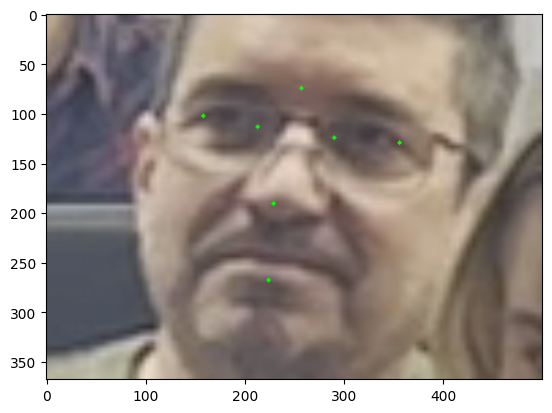

0.8247981394274114


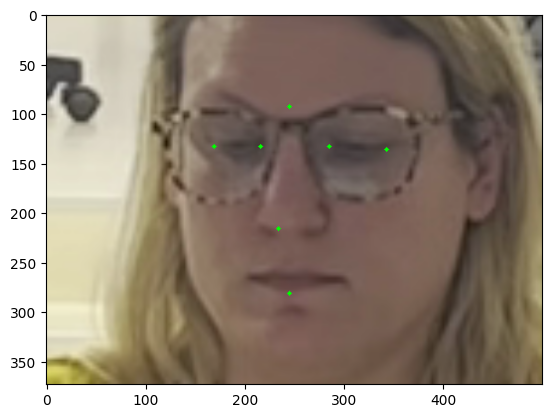

0.9748049539295265


KeyboardInterrupt: 

In [8]:
face_path = os.path.join(data_test_directory, "face_crops")
face_paths = load_image_paths(face_path)
for face_name, path in face_paths.items():
    face = read_image(path)
    mp_landmarks = find_landmarks(face)
    landmark_list = convert_landmarks(face, mp_landmarks)
    face_annotated = annotate_landmarks(face, landmark_list, FOREHEAD_MIDDLE + BOTTOM_LIP + NOSE + LEFT_EYE_EDGES + RIGHT_EYE_EDGES)
    plt.imshow(face_annotated)
    forhead= landmark_list[FOREHEAD_MIDDLE[0]]
    bottomlip = landmark_list[BOTTOM_LIP[0]]
    nose = landmark_list[NOSE[0]]
    forhead_nose_vector = distance_coord(forhead, nose, axis='xy')
    left_eye_outside_lm = landmark_list[LEFT_EYE_EDGES[1]]
    right_eye_outside_lm = landmark_list[RIGHT_EYE_EDGES[1]]
    right_left_eye_vector = distance_coord(left_eye_outside_lm, right_eye_outside_lm, axis='xy')
    ratio = forhead_nose_vector/right_left_eye_vector
    plt.show()
    print(ratio)